In [2]:
import os
import numpy as np
from models.model import Model
from utils import Day
import pickle
import random
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
def get_all_days_lists():
    DAYS_PICKLE_PATH = 'data/days.pickle'
    DATASET_CSV_PATH = 'data/dataset.csv'
    with open(DAYS_PICKLE_PATH, 'rb') as input_file:
        d_train, d_val, d_test = pickle.load(input_file)

    d_train = clean_data(d_train)
    d_val = clean_data(d_val)
    d_test = clean_data(d_test)

    return d_train, d_val, d_test

def clean_data(day_list, zero_attandance_limit=5):
    clean_list = list()
    for day in day_list:
        if day.get_zero_attandance_during_open_hours() <= zero_attandance_limit:
            clean_list.append(day)
    return clean_list

def plot_days(days_list, days=6):
    d_train, d_val, d_test = get_all_days_lists()
    x_train, y_train, x_test, y_test = load_data()
    if days == 'all':
        n_days = len(days_list)
        days_list_indices = list(range(n_days-1))
    elif isinstance(days, list):
        n_days = len(days)
        days_list_indices = days
    elif isinstance(days, int):
        n_days = days
        n_data = len(d_test)
        days_list_indices = random.sample(range(0, n_data), days)
    else:
        print('Not valid option days for `%s`' % (str(days)))
        return

    rows = n_days//2
    columns = 2
    if len(days_list) == 1:
        rows = 1
        columns = 1

    fig = plt.figure(figsize=(19,4*rows))
    for i, day_id in enumerate(days_list_indices):
        x, y = days_list[day_id].build_timeseries()
        ax = fig.add_subplot(rows, columns, i+1)
        ax.title.set_text('day %d' % (day_id))
        l1, = plt.plot(y)
    plt.show()

def load_data(without_reserved=False, normalize=False):
    data_path = 'data/data'
    if without_reserved:
        data_path += '_short'
    if normalize:
        data_path += '_normalize'
    data_path += '.pickle'

    if os.path.isfile(data_path):
        with open(data_path, 'rb') as f:
            x_train, y_train, x_test, y_test = pickle.load(f)
    else:
        d_train, d_val, d_test = get_all_days_lists()
        x_train, y_train = build_feature_vector(d_train+d_val, without_reserved, normalize)
        x_test, y_test = build_feature_vector(d_test, without_reserved, normalize)
        data = [x_train, y_train, x_test, y_test]
        with open(data_path, 'wb') as f:
                pickle.dump(data, f)

    return x_train, y_train, x_test, y_test

def build_feature_vector(days_list, without_reserved=False, normalize=False):
    x, y = list(), list()
    for day in days_list:
        if without_reserved:
            x_day, y_day = day.build_timeseries_without_reservations(3, normalize)
        else:
            x_day, y_day = day.build_timeseries(3, normalize)
        x.append(x_day)
        y.append(y_day)

    for i, data in enumerate(x):
        if i > 0:
            x_data = np.concatenate([x_data,data])
        else:
            x_data = np.array(data)

    for i, data in enumerate(y):
        if i > 0:
            y_data = np.concatenate([y_data,data])
        else:
            y_data = np.array(data)

    return x_data, y_data

In [47]:
d_train, d_val, d_test = get_all_days_lists()

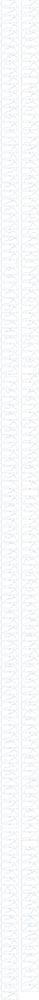

In [30]:
plot_days(d_train, 'all')

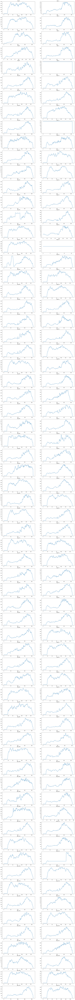

In [27]:
plot_days(d_val, 'all')

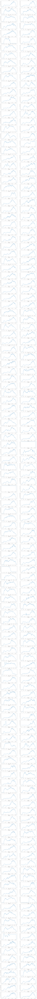

In [28]:
plot_days(d_test, 'all')

In [35]:
for i, row in d_test[92].data.iterrows():
    print(row['time'], row['pool'])

2017-12-06 04:51:12 0
2017-12-06 04:55:52 0
2017-12-06 05:00:56 0
2017-12-06 05:06:03 0
2017-12-06 05:21:14 0
2017-12-06 05:25:31 0
2017-12-06 05:36:09 0
2017-12-06 05:40:55 0
2017-12-06 05:45:50 0
2017-12-06 05:50:46 0
2017-12-06 05:55:19 0
2017-12-06 06:00:56 0
2017-12-06 06:07:07 34
2017-12-06 06:16:25 47
2017-12-06 06:22:34 49
2017-12-06 06:25:29 54
2017-12-06 06:30:39 62
2017-12-06 06:36:17 65
2017-12-06 06:40:52 68
2017-12-06 06:45:57 69
2017-12-06 06:50:23 64
2017-12-06 06:55:31 60
2017-12-06 07:00:48 59
2017-12-06 07:05:40 52
2017-12-06 07:10:05 52
2017-12-06 07:15:11 53
2017-12-06 07:20:11 52
2017-12-06 07:25:06 45
2017-12-06 07:30:05 44
2017-12-06 07:35:04 46
2017-12-06 07:40:04 45
2017-12-06 07:45:05 47
2017-12-06 07:50:04 44
2017-12-06 07:55:04 46
2017-12-06 08:00:06 46
2017-12-06 08:05:05 41
2017-12-06 08:10:06 37
2017-12-06 08:15:05 34
2017-12-06 08:20:11 32
2017-12-06 08:25:04 27
2017-12-06 08:30:04 32
2017-12-06 08:35:04 33
2017-12-06 08:40:04 34
2017-12-06 08:45:05 30


In [4]:
d_train, d_val, d_test = get_all_days_lists()
del_train = [21,35,36,61,68,97,98,127,129,141,188,208,216,221]
del_train.reverse()
del_val = [9,17,31,33,115]
del_val.reverse()
del_test = [10,39,121,132,154,180,197,245,254]
del_test.reverse()

print('Train to delere:')
for index in del_train:
    print(d_train[index].data['time'].iloc[0])
    
print(len(d_train), len(del_train))
for index in del_train:
    del d_train[index]
print(len(d_train))
    
print('Validation to delere:')
for index in del_val:
    print(d_val[index].data['time'].iloc[0])
    
print(len(d_val), len(del_val))
for index in del_val:
    del d_val[index]
print(len(d_val))
    
print('Test to delere:')
for index in del_test:
    print(d_test[index].data['time'].iloc[0])
    
print(len(d_test), len(del_test))
for index in del_test:
    del d_test[index]
print(len(d_test))

Train to delere:
2018-06-11 04:00:03
2018-12-10 04:00:06
2017-12-21 04:01:29
2017-10-14 15:59:06
2018-01-03 06:40:35
2018-06-06 04:00:01
2018-06-08 04:00:02
2018-06-09 08:00:04
2018-12-12 04:00:01
2018-06-14 04:00:02
2019-09-18 04:00:04
2017-12-22 04:34:04
2017-10-21 10:44:56
2018-06-10 08:00:03
262 14
248
Validation to delere:
2018-02-19 04:00:02
2018-12-11 04:00:02
2017-12-20 06:18:40
2018-06-13 04:00:02
2018-06-12 04:00:01
135 5
130
Test to delere:
2018-09-04 04:00:02
2018-03-17 08:00:12
2018-09-05 04:00:03
2017-12-29 06:30:54
2018-12-01 08:00:04
2018-06-05 04:00:02
2018-06-07 04:00:02
2018-12-08 08:00:04
2017-12-31 08:00:07
273 9
264


In [5]:
with open('data/days.pickle', 'wb') as f:
    data = [d_train, d_val, d_test]
    pickle.dump(data, f)